# **WEEK 1: DATA EXPLORATION**
- Explore dataset dimensions. Check
for missing values. Perform data
type conversions as needed.
- Analyze "Aggregate rating"
distribution. Address any class
imbalances.
- Calculate statistics for numerical
columns. Explore categorical
variables. Identify top 5 cuisines
and cities.

In [ ]:
#import libaries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
#load data
df = pd.read_csv('https://raw.githubusercontent.com/Oyeniran20/axia_class_cohort_7/refs/heads/main/Dataset%20.csv')

In [ ]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


- Explore dataset dimensions

In [ ]:
df.shape

(9551, 21)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

- check for missing values


In [ ]:
#checking for missing values
df.isna().sum().sort_values(ascending=False)

,0
Cuisines,9
Restaurant Name,0
Country Code,0
City,0
Restaurant ID,0
Address,0
Locality,0
Longitude,0
Locality Verbose,0
Latitude,0


In [ ]:
df.Cuisines

,Cuisines
0,"French, Japanese, Desserts"
1,Japanese
2,"Seafood, Asian, Filipino, Indian"
3,"Japanese, Sushi"
4,"Japanese, Korean"
...,...
9546,Turkish
9547,"World Cuisine, Patisserie, Cafe"
9548,"Italian, World Cuisine"
9549,Restaurant Cafe


In [ ]:
#finding the most common cuisine
most_common_cuisine = df['Cuisines'].mode()[0]

#fill missing values with the most common cuisine
df['Cuisines'].fillna(most_common_cuisine, inplace=True)

In [ ]:
print(df['Cuisines'].isnull().sum())

0


In [ ]:
print('Most common cuisine:', most_common_cuisine)

Most common cuisine: North Indian


# **Observations**:
- this data contains 9551 entry with 21 features
- there are 9 missing rows at the cuisine columns
- the most common cuisine is 'North Indian'
- all features are with the right data types


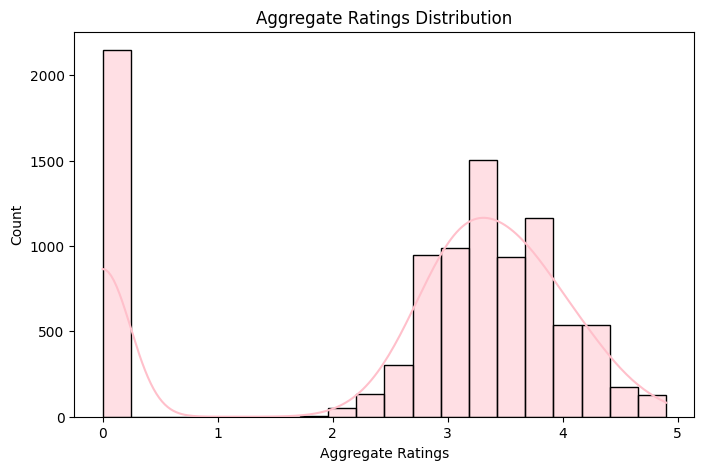

In [ ]:
#checking aggregate rating distributon
plt.figure(figsize=(8, 5))
sns.histplot(df['Aggregate rating'], bins=20, kde=True, color='pink')
plt.title('Aggregate Ratings Distribution')
plt.xlabel('Aggregate Ratings')
plt.ylabel('Count')
plt.show()

In [ ]:
rating_counts = df['Aggregate rating'].value_counts()

In [ ]:
print('Rating distribution:\n', rating_counts)

Rating distribution:
 Aggregate rating
0.0    2148
3.2     522
3.1     519
3.4     498
3.3     483
3.5     480
3.0     468
3.6     458
3.7     427
3.8     400
2.9     381
3.9     335
2.8     315
4.1     274
4.0     266
2.7     250
4.2     221
2.6     191
4.3     174
4.4     144
2.5     110
4.5      95
2.4      87
4.6      78
4.9      61
2.3      47
4.7      42
2.2      27
4.8      25
2.1      15
2.0       7
1.9       2
1.8       1
Name: count, dtype: int64


### Observations
- most resturants have ratings between 2.5 and 4.0.
- very few resturants have extreme ratings
- the peak is around 3.2, which means most of the resturants recieve average ratings.

In [ ]:
#class imbalancing
df['Rating Category'] = pd.cut(df['Aggregate rating'], bins=[0, 2.5, 3.5, 5],
                               labels=['Low', 'Medium', 'High'], include_lowest=True)

In [ ]:
class_counts = df['Rating Category'].value_counts()
print('\nClass distribution before balancing:\n', class_counts)


Class distribution before balancing:
 Rating Category
Medium    4107
High      3000
Low       2444
Name: count, dtype: int64


In [ ]:
X = df.drop(columns=["Aggregate rating", "Rating Category"])
y = df["Rating Category"]

In [ ]:
df.Votes

,Votes
0,314
1,591
2,270
3,365
4,229
...,...
9546,788
9547,1034
9548,661
9549,901


In [ ]:
# Statistics
columns = ["Aggregate rating", "Average Cost for two", "Price range", "Votes"]
numerical_stat = df[columns].describe().T
numerical_stat

,count,mean,std,min,25%,50%,75%,max
Aggregate rating,9551.0,2.666370,1.516378,0.0,2.5,3.2,3.7,4.9
Average Cost for two,9551.0,1199.210763,16121.183073,0.0,250.0,400.0,700.0,800000.0
Price range,9551.0,1.804837,0.905609,1.0,1.0,2.0,2.0,4.0
Votes,9551.0,156.909748,430.169145,0.0,5.0,31.0,131.0,10934.0


## **Top Cuisines and Cities**

In [ ]:
# Top 5 most common cuisines
top_cuisines = df["Cuisines"].str.split(",").explode().str.strip().value_counts()
top_cuisines.head(5)

,count
Cuisines,
North Indian,3969
Chinese,2735
Fast Food,1986
Mughlai,995
Italian,764


<ipython-input-21-e3f947d4dcd8>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_cuisines.values, y=top_cuisines.index, palette="coolwarm")


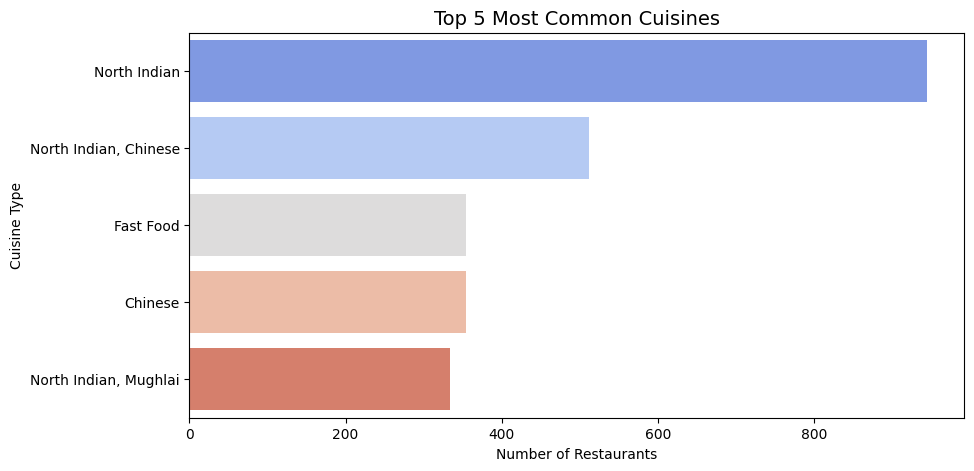

In [ ]:
# plot
top_cuisines = df["Cuisines"].value_counts().head(5)

plt.figure(figsize=(10, 5))
sns.barplot(x=top_cuisines.values, y=top_cuisines.index, palette="coolwarm")
plt.title("Top 5 Most Common Cuisines", fontsize=14)
plt.xlabel("Number of Restaurants")
plt.ylabel("Cuisine Type")
plt.show()


**Top 5 Most Common Cuisines**

- North Indian is the most popular cuisine, followed by Chinese and Fast Food.
- Mughlai and Italian food are also represented.


In [ ]:
top_cities = df["City"].value_counts()
top_cities.head(5)

,count
City,
New Delhi,5473
Gurgaon,1118
Noida,1080
Faridabad,251
Ghaziabad,25


<ipython-input-23-33b16c16cdbf>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_cities.values, y=top_cities.index, palette="inferno")


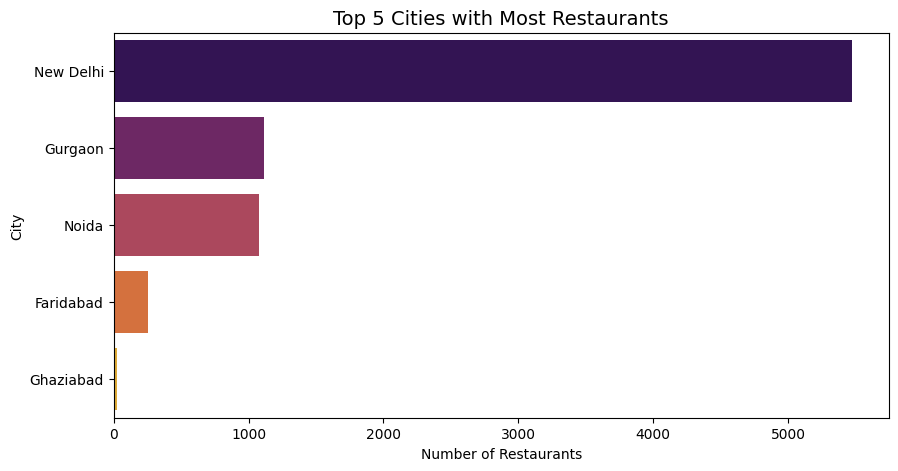

In [ ]:
#plot
top_cities = df["City"].value_counts().head(5)
plt.figure(figsize=(10, 5))
sns.barplot(x=top_cities.values, y=top_cities.index, palette="inferno")
plt.title("Top 5 Cities with Most Restaurants", fontsize=14)
plt.xlabel("Number of Restaurants")
plt.ylabel("City")
plt.show()


# **Observations**
- New Delhi dominates with the most resturants.
- Gurgaon and Noida takes second place
- smaller cities have fewer resturants.

# **Week 2: Data visualization**
- Create histograms,
bar plots, and box
plots of ratings.
Compare average
ratings across
cuisines and cities
- Map restaurant
locations using
coordinates.
Analyze distribution
across cities.
Correlate location
with ratings
- Identify outliers and
their effects.
Determine
relationship
between votes and
ratings.


### **NOTE**: Ratings visualization are displayed above.

## **Comparing average ratings accross Cuisines and City**


In [ ]:
#Average ratings for each cuisine
avg_rate_cuisines = df.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)

avg_rate_cuisines.head(10)

,Aggregate rating
Cuisines,
"Burger, Bar Food, Steak",4.9
"American, Burger, Grill",4.9
"American, Caribbean, Seafood",4.9
"American, Coffee and Tea",4.9
"Mexican, American, Healthy Food",4.9
"Italian, Bakery, Continental",4.9
"BBQ, Breakfast, Southern",4.9
"European, German",4.9
"Hawaiian, Seafood",4.9


**Plotting the Average ratings accross cuisines**

<ipython-input-25-a012e2946c33>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=avg_rate_cuisines.index, x=avg_rate_cuisines.values, palette='coolwarm')


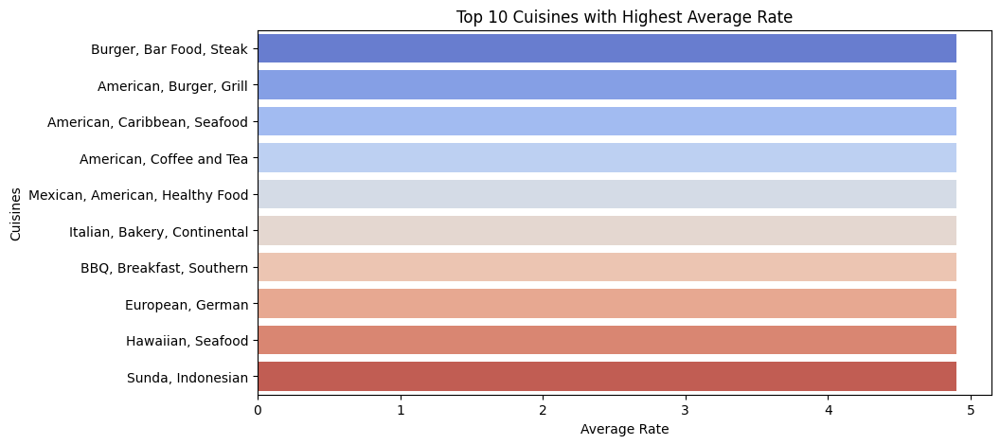

In [ ]:
avg_rate_cuisines = df.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False).head(10)
plt.figure(figsize=(10, 5))
sns.barplot(y=avg_rate_cuisines.index, x=avg_rate_cuisines.values, palette='coolwarm')
plt.title('Top 10 Cuisines with Highest Average Rate')
plt.xlabel('Average Rate')
plt.ylabel('Cuisines')
plt.show()

In [ ]:
#Average ratings for each city
avg_rate_city = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)
avg_rate_city.head(10)

,Aggregate rating
City,
Inner City,4.900000
Quezon City,4.800000
Makati City,4.650000
Pasig City,4.633333
Mandaluyong City,4.625000
Beechworth,4.600000
London,4.535000
Taguig City,4.525000
Secunderabad,4.500000


**Plotting the average ratings across cities**

<ipython-input-27-537135824de1>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=avg_rate_city.index, x=avg_rate_city.values, palette='magma')


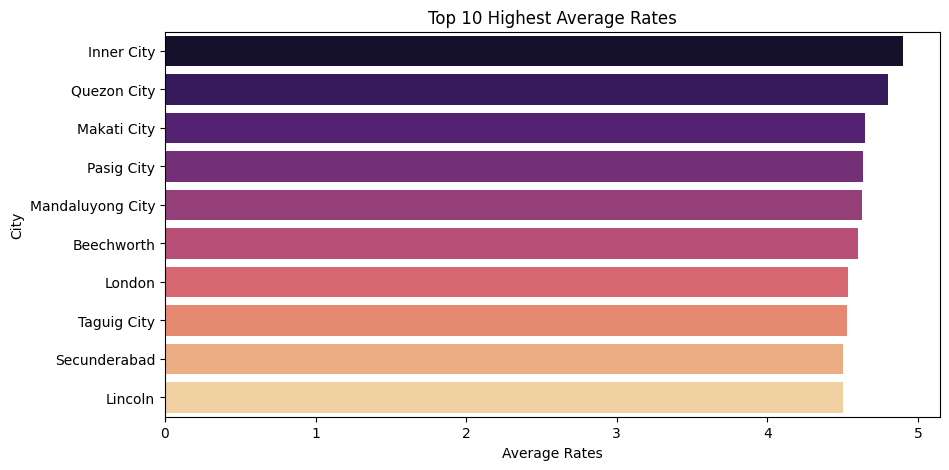

In [ ]:
avg_rate_city = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False).head(10)
plt.figure(figsize=(10, 5))
sns.barplot(y=avg_rate_city.index, x=avg_rate_city.values, palette='magma')
plt.title('Top 10 Highest Average Rates')
plt.xlabel('Average Rates')
plt.ylabel('City')
plt.show()

**Observations**
- Italian, Deli tend to have the higest average ratings in cuisines
- philipine based cities like Quezon city, Makati city rank high.


**MAPPING RESTURANT LOCATIONS WITH COORDINATES**

In [ ]:
import folium
from folium.plugins import MarkerCluster

# Create a map centered around the average location
map_center = [df["Latitude"].mean(), df["Longitude"].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=5)

# Add restaurant locations as markers
marker_cluster = MarkerCluster().add_to(restaurant_map)

for index, row in df.iterrows():
    folium.Marker(
        location=[row["Latitude"], row["Longitude"]],
        popup=f'{row["Restaurant Name"]} - Rating: {row["Aggregate rating"]}',
        icon=folium.Icon(color="purple" if row["Aggregate rating"] >= 4 else "orange")
    ).add_to(marker_cluster)


restaurant_map

### **Identifying outliers and their effects**

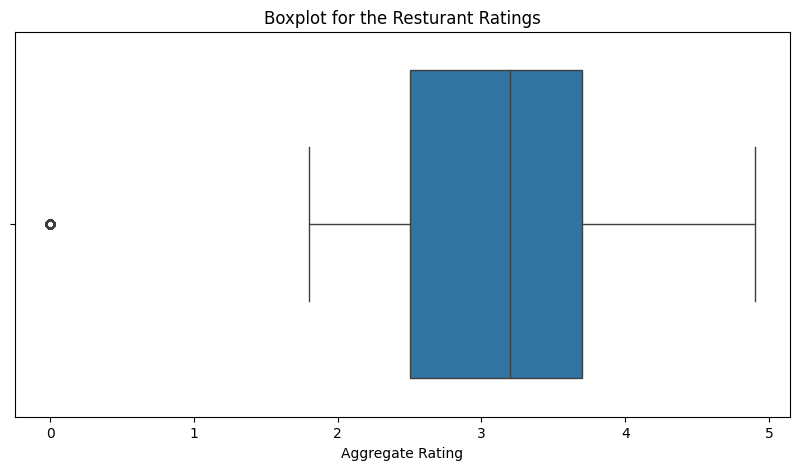

In [ ]:
#using boxplot for aggregate ratings
plt.figure(figsize=(10, 5))
sns.boxplot(x=df['Aggregate rating'])
plt.title('Boxplot for the Resturant Ratings')
plt.xlabel('Aggregate Rating')
plt.show()

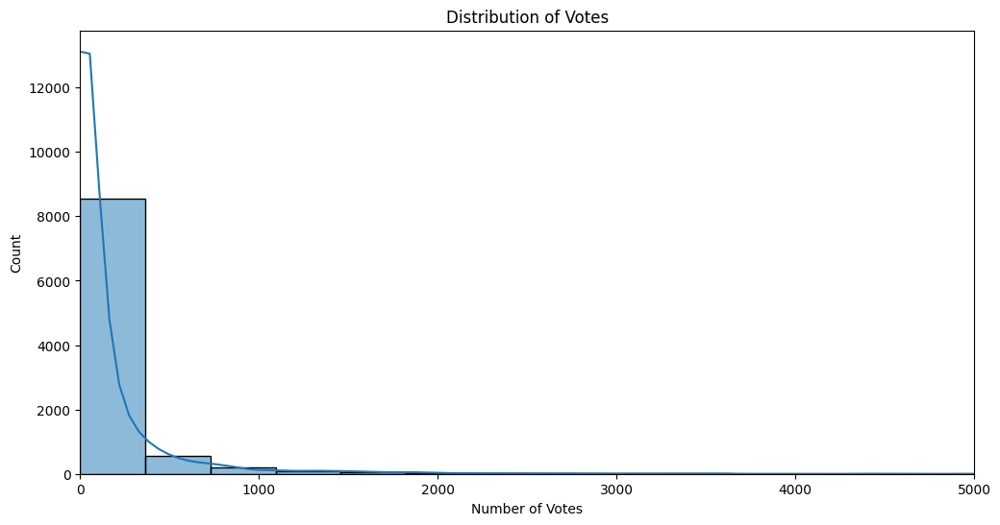

In [ ]:
# Histogram for Votes
plt.figure(figsize=(12, 6))
sns.histplot(df['Votes'], bins=30, kde=True)
plt.title('Distribution of Votes')
plt.xlabel('Number of Votes')
plt.ylabel('Count')

#for clearer visibility
plt.xlim(0, 5000)
plt.show()


**effects of outliers**
- high voted resturant may have stronger customer engagements
-some resturants have few number of votes making their ratings less reliable
- removing outliers could make the vote analysis to be more stabled.
-

***Relationship between votes and ratings***

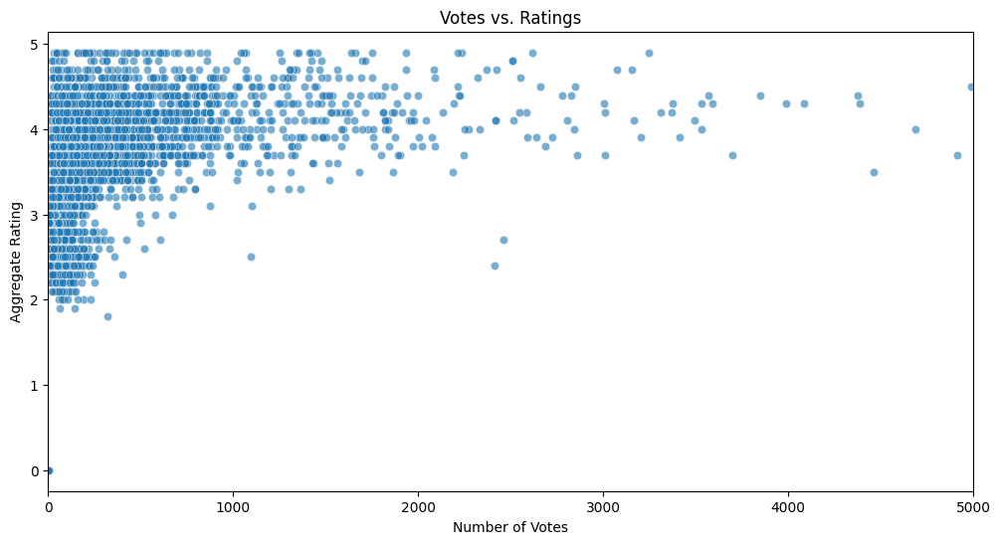

In [ ]:
# Plot of Votes vs. Ratings
plt.figure(figsize=(12, 6))
sns.scatterplot(x=df['Votes'], y=df['Aggregate rating'], alpha=0.6,)
plt.title('Votes vs. Ratings')
plt.xlabel('Number of Votes')
plt.ylabel('Aggregate Rating')

#for better visibility
plt.xlim(0, 5000)
plt.show()


 **Observations**
 - The best visualization to use is a scatter plot because helps to directly show the vote ratings relationship better than the others.

- Resturants with more votes usually have higher ratings
- Some high rated resturants have fewer votes(new buisness)

In [ ]:
# correlation
correlation = df['Votes'].corr(df['Aggregate rating'])
correlation


np.float64(0.31369058419541157)

**SUMMARY**:
- most resturants have ratings between 2.5 to 4.0
- higher priced restaurants tend to have better ratings
- more votes generally leads to higher ratings.
- the heatmap shows a lot of reataurant density across diffrent cities.

# **Week 3: Customer Preferences**
- Cuisine Analysis: Identify highest-rated cuisines
- Price Range: Compare ratings across price points
- Service Features: Analyze table booking and delivery

Analyze relationships between cuisines and ratings. Identify popular cuisines by votes. Determine which price ranges
receive highest ratings. Compare restaurants with and without table booking.

**Additional Insights**

- Table Booking Impact: Determine if table booking
availability affects ratings
across different cities.
Compare average ratings
with and without this
feature.

- Online Delivery Analysis: Calculate percentage of
restaurants offering
delivery. Analyze availability
across different price
ranges.

- Customer Preferences: Identify specific cuisines that consistently receive higher
ratings. Determine city-specific preferences



In [ ]:
#cuisine analysis
# top 5 cuisines with highest average ratings
top_cuisine_ratings = df.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)
top_cuisine_ratings.head(5)

,Aggregate rating
Cuisines,
"Burger, Bar Food, Steak",4.9
"American, Burger, Grill",4.9
"American, Caribbean, Seafood",4.9
"American, Coffee and Tea",4.9
"Mexican, American, Healthy Food",4.9


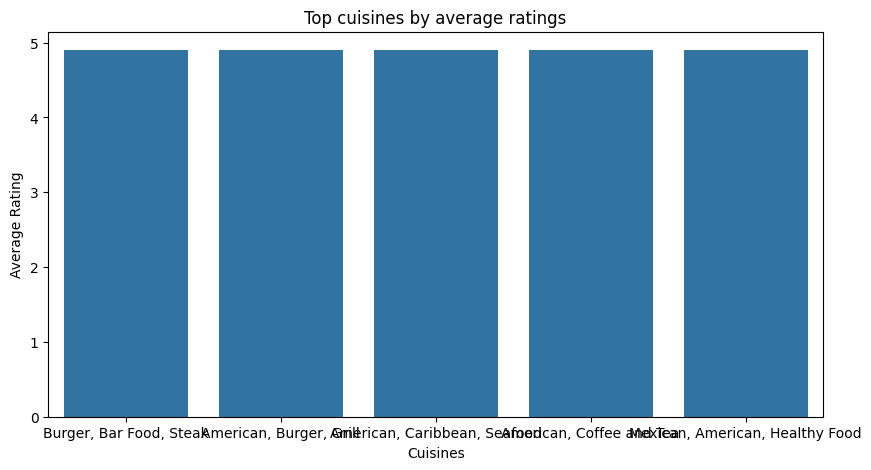

In [ ]:
#plotting average ratings of top cuisines
top_cuisine_ratings = df.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False).head(5)
plt.figure(figsize=(10, 5))
sns.barplot(x=top_cuisine_ratings.index, y=top_cuisine_ratings.values)
plt.xlabel('Cuisines')
plt.ylabel('Average Rating')
plt.title('Top cuisines by average ratings')
plt.show()

In [ ]:
#top 10 most voted cuisines
top_cuisine_votes = df.groupby('Cuisines')['Votes'].sum().sort_values(ascending=False)
top_cuisine_votes.head(10)

,Votes
Cuisines,
"North Indian, Mughlai",53747
North Indian,48967
"North Indian, Chinese",42012
Cafe,30657
Chinese,21925
"North Indian, Mughlai, Chinese",20115
Fast Food,17852
South Indian,16433
"Mughlai, North Indian",15275


<ipython-input-36-03ac0b6f900d>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_cuisine_votes.index, y=top_cuisine_votes.values, palette='magma')


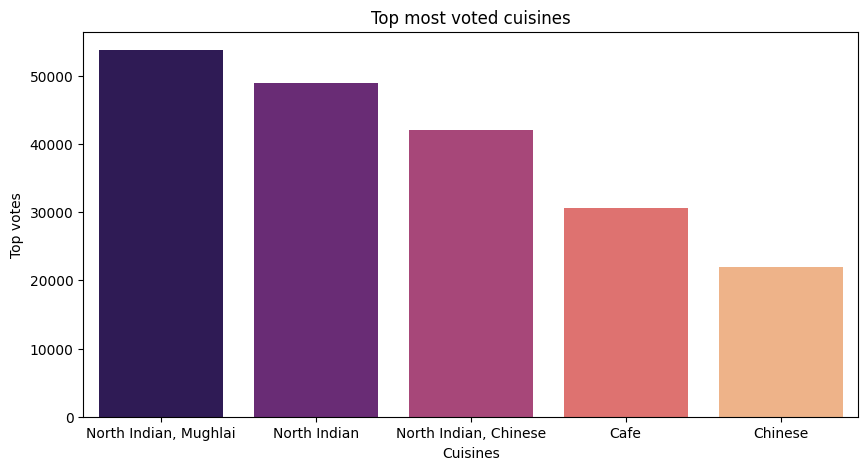

In [ ]:
#plotting for most voted cuisines
top_cuisine_votes = df.groupby('Cuisines')['Votes'].sum().sort_values(ascending=False).head(5)
plt.figure(figsize=(10, 5))
sns.barplot(x=top_cuisine_votes.index, y=top_cuisine_votes.values, palette='magma')
plt.xlabel('Cuisines')
plt.ylabel('Top votes')
plt.title('Top most voted cuisines')
plt.show()

## **OBSERVATION**
- this shows that North indian, Mughlai and Chinese cuisines are the most popular by votes.
- italian ,deli & hawiian seafood cuisines have the highest ratings.

**Price Range**

In [ ]:
price_range_ratings = df.groupby("Price range")["Aggregate rating"].mean()
price_range_ratings.head()

,Aggregate rating
Price range,
1,1.999887
2,2.941054
3,3.683381
4,3.817918


<ipython-input-38-4bb4fe0f7665>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=price_range_ratings.index, y=price_range_ratings.values, palette='coolwarm')


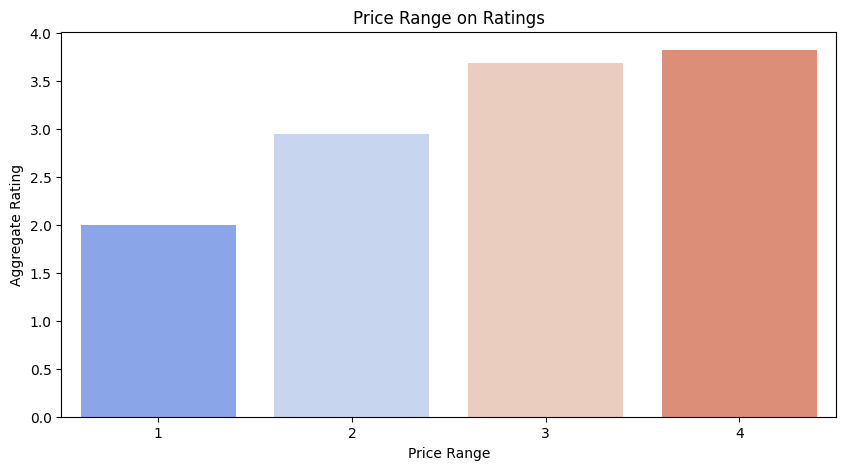

In [ ]:
#Bar plot of price range and ratings
price_range_ratings = df.groupby("Price range")["Aggregate rating"].mean().head(5)
plt.figure(figsize=(10, 5))
sns.barplot(x=price_range_ratings.index, y=price_range_ratings.values, palette='coolwarm')
plt.xlabel('Price Range')
plt.ylabel('Aggregate Rating')
plt.title('Price Range on Ratings')
plt.show()

**COMMENT**: Customers tend to rate expensive restaurants higher, possibly due to better quality service and food.

### **Analyzing Table Booking and Online Delivery**

In [ ]:
table_booking_ratings = df.groupby('Has Table booking')['Aggregate rating'].mean()
table_booking_ratings.head()

,Aggregate rating
Has Table booking,
No,2.559359
Yes,3.441969


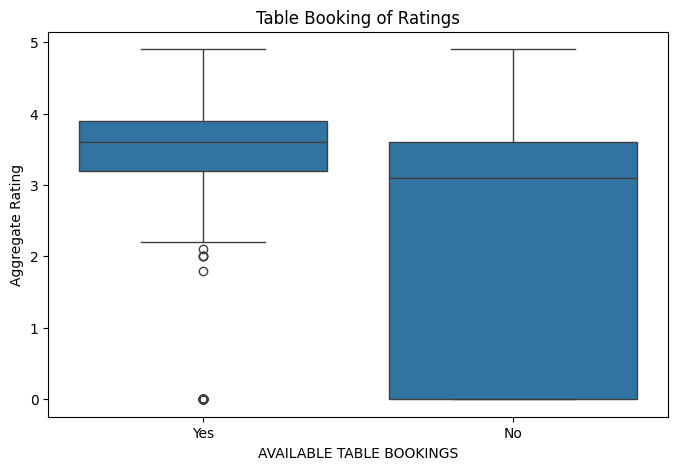

In [ ]:
#plotting
plt.figure(figsize=(8, 5))
sns.boxplot(x=df['Has Table booking'], y=df['Aggregate rating'])
plt.xlabel('AVAILABLE TABLE BOOKINGS')
plt.ylabel('Aggregate Rating')
plt.title('Table Booking of Ratings')
plt.show()

In [ ]:
online_delivery_ratings = df.groupby('Has Online delivery')['Aggregate rating'].mean()
online_delivery_ratings.head()

,Aggregate rating
Has Online delivery,
No,2.465296
Yes,3.248837


<ipython-input-42-6340dd5d6fd7>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df['Has Online delivery'], y=df['Aggregate rating'], palette='Set3')


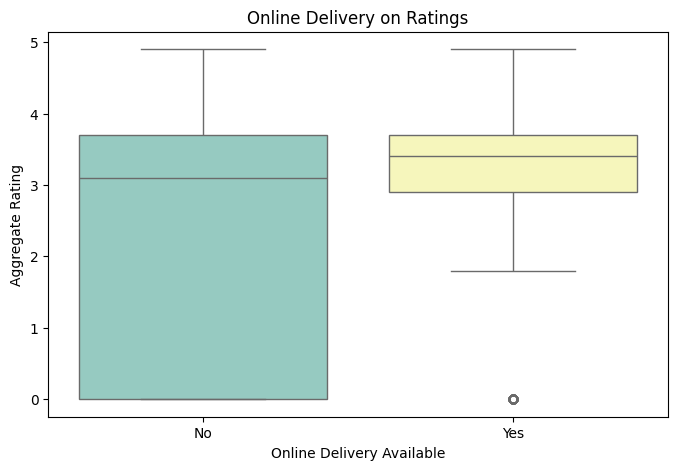

In [ ]:
#plotting
plt.figure(figsize=(8, 5))
sns.boxplot(x=df['Has Online delivery'], y=df['Aggregate rating'], palette='Set3')
plt.xlabel('Online Delivery Available')
plt.ylabel('Aggregate Rating')
plt.title('Online Delivery on Ratings')
plt.show()

**OBSERVATIONS**
- Without table booking = 2.56
- With table booking = 3.44

Therefore customers prefer restaurants with table bookings.(peharps due to better services)
- Without online delivery = 2.46
- With online delivery = 3.25

Therefore restaurants that offers online delivery tend to recieve higher ratings (peharps because of convenience).

## **City Specific Preferences**

In [ ]:
# Find the most common cuisine in each city
city_cuisine = df.groupby("City")["Cuisines"].agg(lambda x: x.mode())
city_cuisine.head()


,Cuisines
City,
Abu Dhabi,"[American, Indian, Italian, Pizza]"
Agra,"North Indian, Mughlai"
Ahmedabad,"[Cafe, American, Continental, Armenian, Fast F..."
Albany,North Indian
Allahabad,"North Indian, Chinese"


In [ ]:
# Compute average rating per city
city_avg_rating = df.groupby("City")["Aggregate rating"].mean().sort_values(ascending=False)
city_avg_rating.head()

,Aggregate rating
City,
Inner City,4.900000
Quezon City,4.800000
Makati City,4.650000
Pasig City,4.633333
Mandaluyong City,4.625000


In [ ]:
# Merging both results
city_cuisine_rating = pd.DataFrame({'Most Popular Cuisine': city_cuisine, 'Average Rating': city_avg_rating})
city_cuisine_rating.head(10)

,Most Popular Cuisine,Average Rating
City,,
Abu Dhabi,"[American, Indian, Italian, Pizza]",4.300000
Agra,"North Indian, Mughlai",3.965000
Ahmedabad,"[Cafe, American, Continental, Armenian, Fast F...",4.161905
Albany,North Indian,3.555000
Allahabad,"North Indian, Chinese",3.395000
Amritsar,North Indian,3.685714
Ankara,"Kebab, Turkish Pizza",4.305000
Armidale,"Bar Food, Steak",3.500000
Athens,"American, Italian, Pizza",4.200000


# **Week 4: Predictive Modeling**
- Feature Engineering:
Extract additional features from existing columns. Create new features by encoding categorical variables.
- Model Building:
Build regression models to predict restaurant ratings. Split data into training and testing sets.
- Model Evaluation:
Evaluate using RMSE, MAE, and R-squared. Compare different algorithms like linear regression and random forest.

**Feature engineering (encoding categorical variables)**

In [ ]:
#importing necessary libraies
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


In [ ]:
features = ['Votes', 'Average Cost for two', 'Price range', 'Has Table booking', 'Has Online delivery']
target = 'Aggregate rating'

df['Has Table booking'] = df['Has Table booking'].map({'Yes': 1, 'No': 0})
df['Has Online delivery'] = df['Has Online delivery'].map({'Yes': 1, 'No': 0})

X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
X_train.shape

(7640, 5)

In [ ]:
X_test.shape

(1911, 5)

Training set: 7,640
Test set: 1,911


**Linear Regression model**


In [ ]:
model = LinearRegression()
model.fit(X_train, y_train)

#predictions on the test set
y_pred = model.predict(X_test)

#evaluation metrics for linear regression
rmse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)


In [ ]:
rmse

1.6764802747031442

In [ ]:
mae

1.0750712721369127

In [ ]:
r2

0.2634446409021949

- Root Mean Squared Error = 1.29
- Mean Absolute Error = 1.08
- R-Squared Score = 0.26

**OBSERVATIONS**
- On average the model's predications deviate bay 1.29 rating
- The average absolute error in predictions ia 1.08 rating points.
- The model explains 26% of the variance in the restaurant ratings, showing a weak predictive power.
- The model is not very accurate so suggesting that restaurant ratings depends on more complex factors that aren't captured in the dataset.
- Should most likely compare with more advanced models like Random forest.


**Using Random Forest**


In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

#predicting the test set
y_pred_rf = rf_model.predict(X_test)

#evaluation metrics for random forest model
rmse_rf = mean_squared_error(y_test, y_pred_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

In [ ]:
rmse_rf

0.13399903138539526

In [ ]:
mae_rf

0.23648313242008087

In [ ]:
r2_rf

0.9411280250832034

**OBSERVATIONS**
- Root mean squared error = 0.37
- Mean absolute error = 0.24
- R-Squared score = 0.94


  The model explains that 94% of the variance in restaurant ratings. meaning it is highly accurate in it's prediction.


  **CONCLUSION**
  - Random Forest is a better option than Linear Regression.
  - it also suggest that the restaurant ratings are highly influenced by complex non linear relationships which random forest captured very well.